# Predicting Booking Cancelation

#### Machine Learning for Marketing

From the dataset and challenge available at: https://www.kaggle.com/jessemostipak/hotel-booking-demand

2021

# I. Business Understanding

Have you ever wondered when the best time of year to book a hotel room is? Or the optimal length of stay in order to get the best daily rate? What if you wanted to predict whether or not a hotel was likely to receive a disproportionately high number of special requests?

This hotel booking dataset can help you explore those questions!

# II. Data Understanding

## Dataset Description

- <b>hotel:</b> hotel location
- <b>is_canceled:</b> [prediction variable] if the booking was or not is_canceled
- <b>lead_time:</b>
- <b>arrival_date_year:</b> year of the arrival
- <b>arrival_date_month:</b> month of the arrival
- <b>arrival_date_week_number</b> week number of the arrival (1 to 53)
- <b>arrival_date_day_of_month:</b> day of the month of the arrival
- <b>stays_in_weekend_nights:</b>
- <b>stays_in_week_nights</b>
- <b>adults:</b> total of adult guests
- <b>children:</b> total of children guests
- <b>babies:</b> total of babies guests
- <b>meal:</b> type of meals included in the booking (SC and undefined to no meal selected)
- <b>country:</b> coutntry of the guest origin
- <b>market_segment:</b> Market segment designation. In categories, the term “TA” means “Travel Agents” and “TO” means “Tour Operators”
- <b>distribution_channel:</b> Booking distribution channel. The term “TA” means “Travel Agents” and “TO” means “Tour Operators”
- <b>is_repeated_guest:</b> Value indicating if the booking name was from a repeated guest (1) or not (0)
- <b>previous_cancellations:</b> Number of previous bookings that were cancelled by the customer prior to the current booking
- <b>previous_bookings_not_canceled:</b> Number of previous bookings not cancelled by the customer prior to the current booking
- <b>reserved_room_type:</b> Code of room type reserved. Code is presented instead of designation for anonymity reasons.
- <b>assigned_room_type:</b> Code for the type of room assigned to the booking. Sometimes the assigned room type differs from the reserved room type due to hotel operation reasons (e.g. overbooking) or by customer request. Code is presented instead of designation for anonymity reasons.
- <b>booking_changes:</b> Number of changes/amendments made to the booking from the moment the booking was entered on the PMS until the moment of check-in or cancellation
- <b>deposity_type:</b> Indication on if the customer made a deposit to guarantee the booking. This variable can assume three categories: No Deposit – no deposit was made; Non Refund – a deposit was made in the value of the total stay cost; Refundable – a deposit was made with a value under the total cost of stay.
- <b>agent:</b> ID of the travel agency that made the booking
- <b>company:</b> ID of the company/entity that made the booking or responsible for paying the booking. ID is presented instead of designation for anonymity reasons
- <b>days_in_waiting_list:</b> Number of days the booking was in the waiting list before it was confirmed to the customer
- <b>customer_type:</b> Type of booking, assuming one of four categories: Contract - when the booking has an allotment or other type of contract associated to it; Group – when the booking is associated to a group; Transient – when the booking is not part of a group or contract, and is not associated to other transient booking; Transient-party – when the booking is transient, but is associated to at least other transient booking.
- <b>adr:</b> Average Daily Rate as defined by dividing the sum of all lodging transactions by the total number of staying nights
- <b>required_car_parking:</b> Number of car parking spaces required by the customer
- <b>total_of_special_requests:</b> Number of special requests made by the customer (e.g. twin bed or high floor)
- <b>reservation_status:</b> Reservation last status, assuming one of three categories: Canceled – booking was canceled by the customer; Check-Out – customer has checked in but already departed; No-Show – customer did not check-in and did inform the hotel of the reason why
- <b>reservation_status_date:</b> Date at which the last status was set. This variable can be used in conjunction with the ReservationStatus to understand when was the booking canceled or when did the customer checked-out of the hotel

In [1]:
import os
import csv
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## II.a Load and Describe the Data

In [2]:
# Loading the data 
df = pd.read_csv('hotel_bookings.csv')


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [4]:
df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
hotel,119390,2,City Hotel,79330,NaN,NaN,NaN,NaN,NaN,NaN,NaN
is_canceled,119390.0,NaN,NaN,NaN,0.370416,0.482918,0.0,0.0,0.0,1.0,1.0
lead_time,119390.0,NaN,NaN,NaN,104.011416,106.863097,0.0,18.0,69.0,160.0,737.0
arrival_date_year,119390.0,NaN,NaN,NaN,2016.156554,0.707476,2015.0,2016.0,2016.0,2017.0,2017.0
arrival_date_month,119390,12,August,13877,NaN,NaN,NaN,NaN,NaN,NaN,NaN
arrival_date_week_number,119390.0,NaN,NaN,NaN,27.165173,13.605138,1.0,16.0,28.0,38.0,53.0
arrival_date_day_of_month,119390.0,NaN,NaN,NaN,15.798241,8.780829,1.0,8.0,16.0,23.0,31.0
stays_in_weekend_nights,119390.0,NaN,NaN,NaN,0.927599,0.998613,0.0,0.0,1.0,2.0,19.0
stays_in_week_nights,119390.0,NaN,NaN,NaN,2.500302,1.908286,0.0,1.0,2.0,3.0,50.0
adults,119390.0,NaN,NaN,NaN,1.856403,0.579261,0.0,2.0,2.0,2.0,55.0


In [5]:
# Checking for missing values

null = pd.DataFrame({'Missing Values' : df.isna().sum(), 'Percentage Missing Values' : (df.isna().sum()) / (df.shape[0]) * (100)})
null

,Missing Values,Percentage Missing Values
hotel,0,0.000000
is_canceled,0,0.000000
lead_time,0,0.000000
arrival_date_year,0,0.000000
arrival_date_month,0,0.000000
arrival_date_week_number,0,0.000000
arrival_date_day_of_month,0,0.000000
stays_in_weekend_nights,0,0.000000
stays_in_week_nights,0,0.000000
adults,0,0.000000


## II.b Numerical Variables

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fdf60829b50>,
      dtype=object)

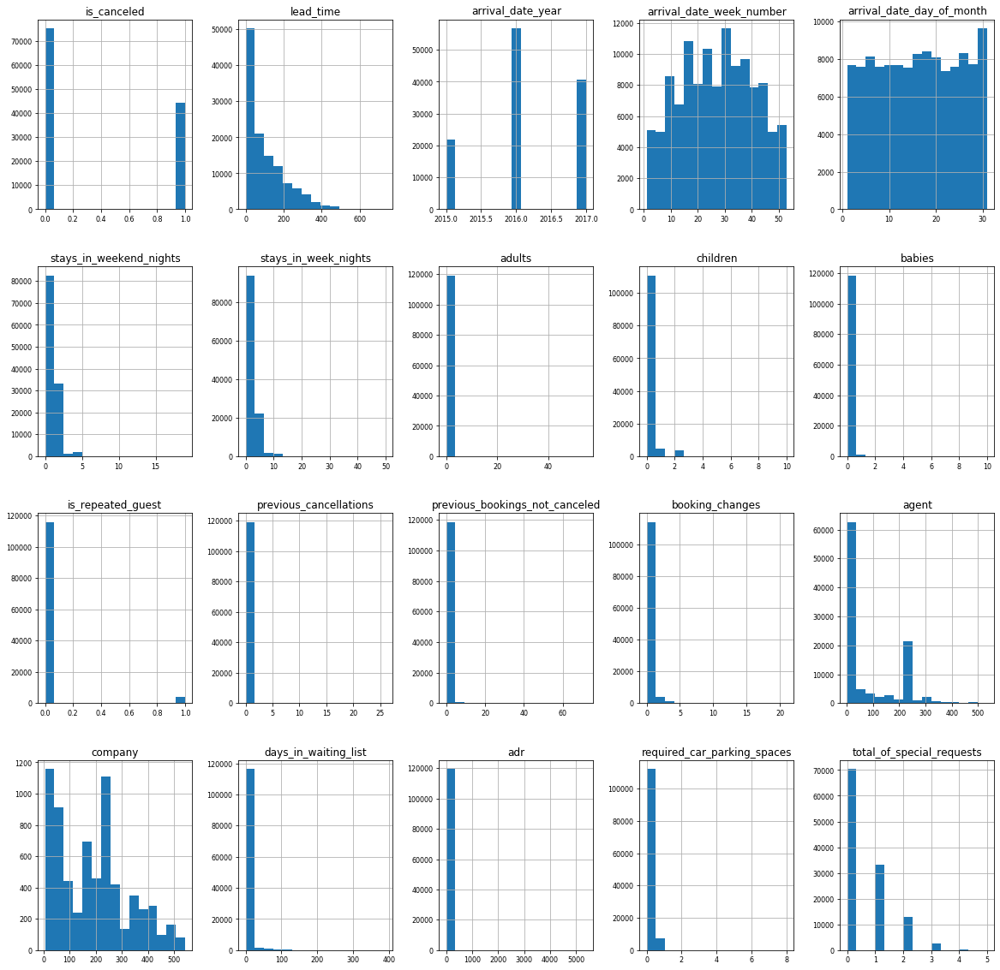

In [6]:
# Do histograms on all numeric variables
numerical=df.select_dtypes(include=[np.number]).columns.tolist()
df[numerical].hist(bins=15, figsize=(20, 20), layout=(4, 5), xlabelsize=8, ylabelsize=8)

/Users/lagonick/opt/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/lagonick/opt/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/Users/lagonick/opt/anaconda3/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  Fut

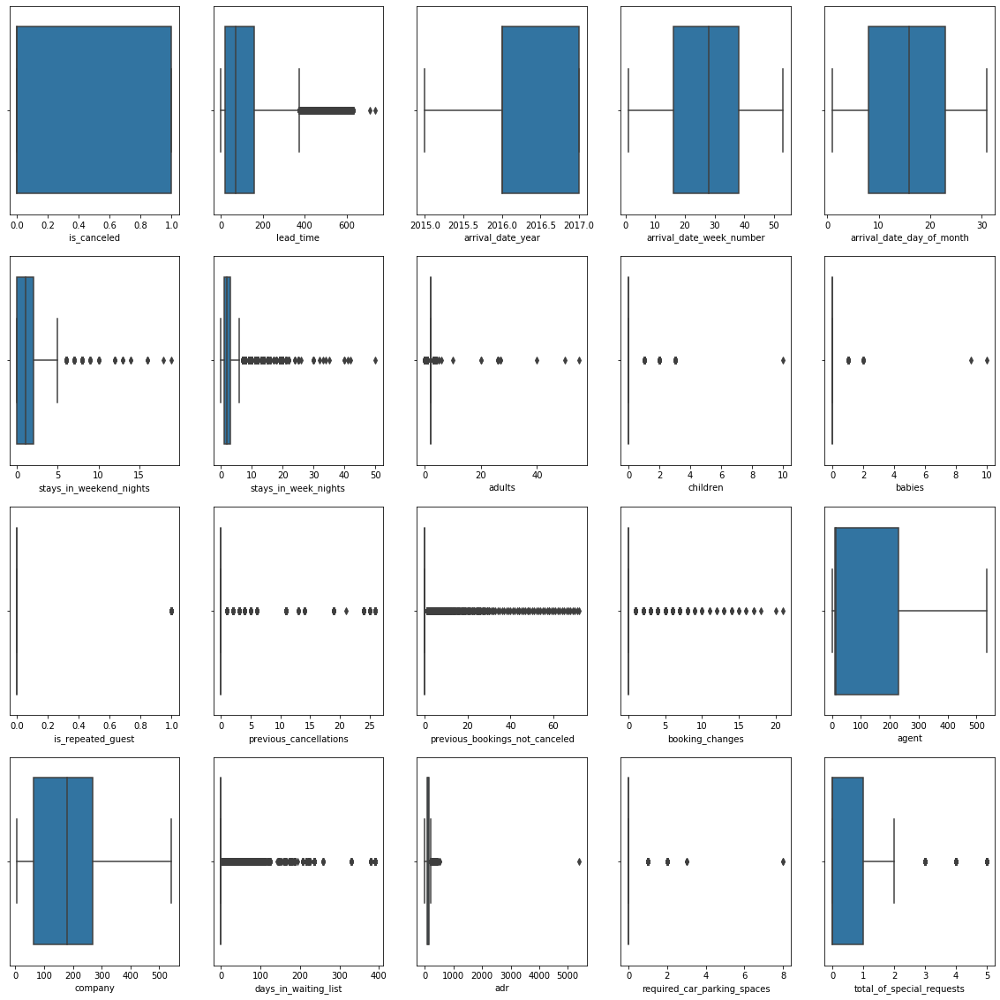

In [7]:
# Do boxplots on all numeric variables
fig, ax = plt.subplots(4, 5, figsize=(20, 20))
for var, subplot in zip(df[numerical], ax.flatten()):
    sns.boxplot(df[var], ax=subplot)

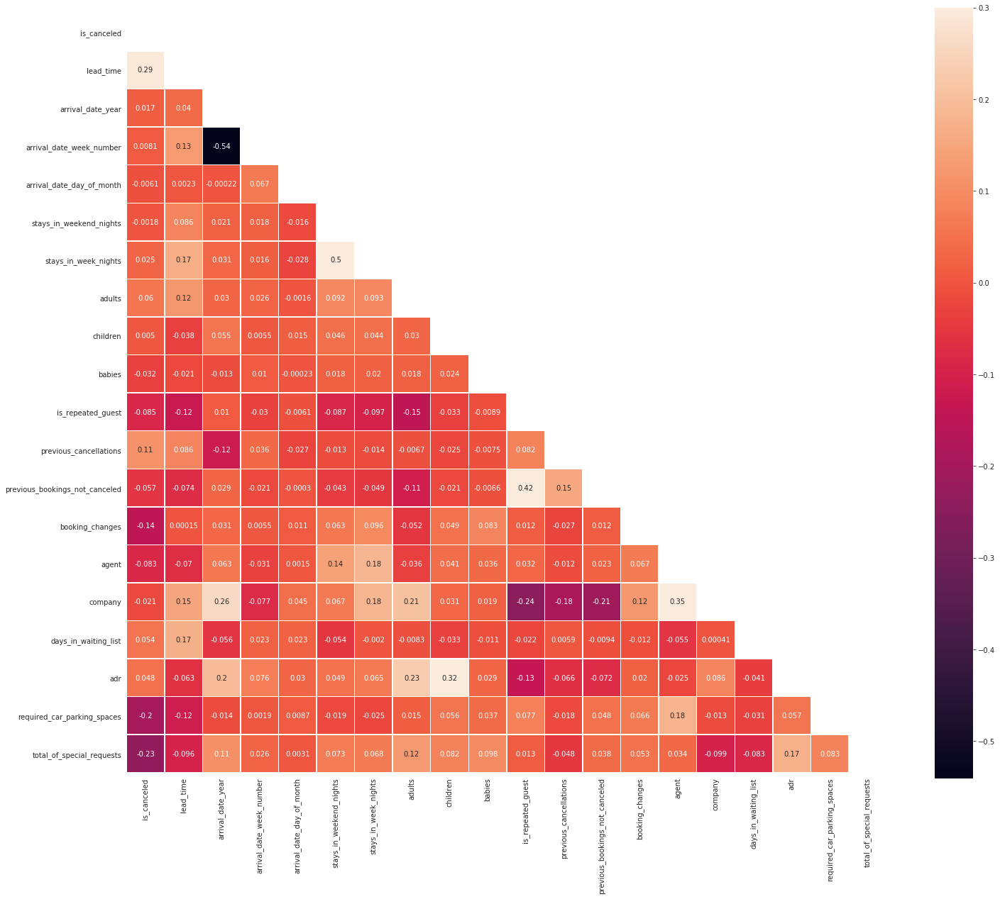

In [8]:
corr = df[numerical].corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(24,20))
    ax = sns.heatmap(corr, mask=mask, vmax=.3, square=True, annot=True, linewidths=.5)

In [9]:
correlation = df.corr()['is_canceled'].abs().sort_values(ascending = False)
correlation

is_canceled                       1.000000
lead_time                         0.293123
total_of_special_requests         0.234658
required_car_parking_spaces       0.195498
booking_changes                   0.144381
previous_cancellations            0.110133
is_repeated_guest                 0.084793
agent                             0.083114
adults                            0.060017
previous_bookings_not_canceled    0.057358
days_in_waiting_list              0.054186
adr                               0.047557
babies                            0.032491
stays_in_week_nights              0.024765
company                           0.020642
arrival_date_year                 0.016660
arrival_date_week_number          0.008148
arrival_date_day_of_month         0.006130
children                          0.005048
stays_in_weekend_nights           0.001791
Name: is_canceled, dtype: float64

## II.c Categorical Variables

In [10]:
df.describe(include="object").T

,count,unique,top,freq
hotel,119390,2,City Hotel,79330
arrival_date_month,119390,12,August,13877
meal,119390,5,BB,92310
country,118902,177,PRT,48590
market_segment,119390,8,Online TA,56477
distribution_channel,119390,5,TA/TO,97870
reserved_room_type,119390,10,A,85994
assigned_room_type,119390,12,A,74053
deposit_type,119390,3,No Deposit,104641
customer_type,119390,4,Transient,89613


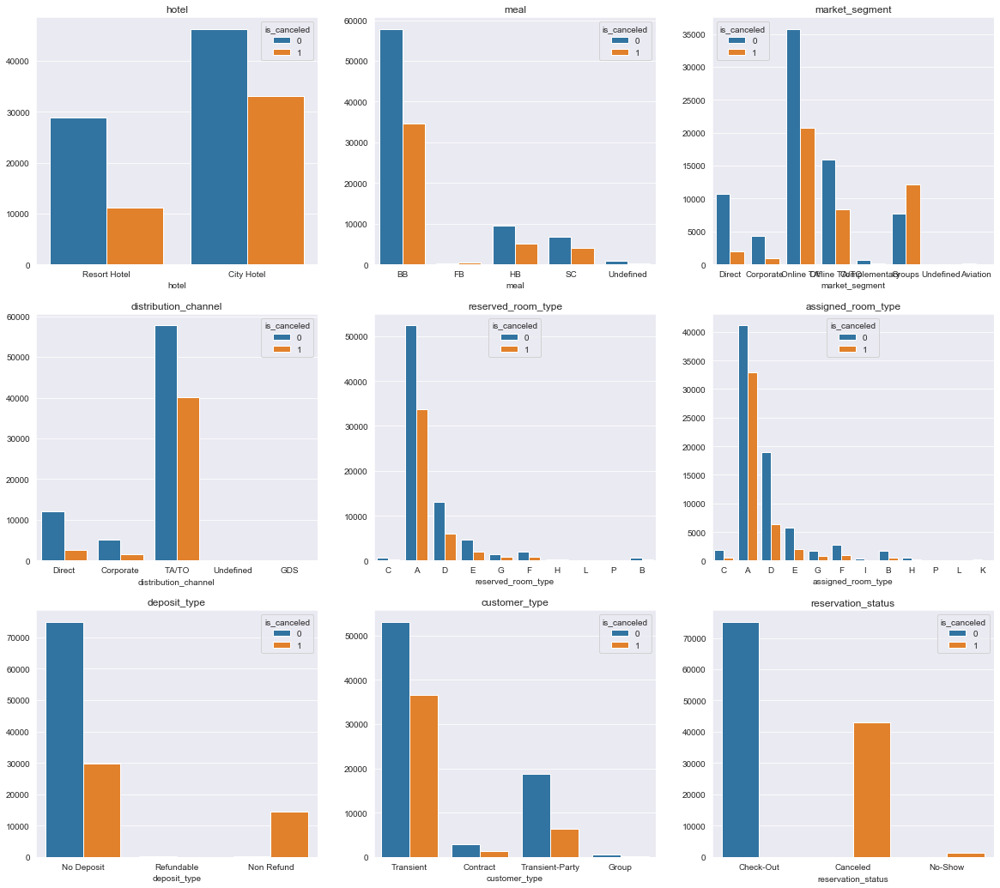

In [11]:
sns.set_style(style="darkgrid") 
f, axes = plt.subplots(nrows=3, ncols=3, figsize=(20,18))

sns.countplot(data=df, x='hotel', hue="is_canceled", ax=axes[0][0]).set(ylabel=None);
sns.countplot(data=df, x='meal', hue="is_canceled", ax=axes[0][1]).set(ylabel=None);
sns.countplot(data=df, x='market_segment', hue="is_canceled", ax=axes[0][2]).set(ylabel=None);
sns.countplot(data=df, x='distribution_channel', hue="is_canceled", ax=axes[1][0]).set(ylabel=None);
sns.countplot(data=df, x='reserved_room_type', hue="is_canceled", ax=axes[1][1]).set(ylabel=None);
sns.countplot(data=df, x='assigned_room_type', hue="is_canceled", ax=axes[1][2]).set(ylabel=None);
sns.countplot(data=df, x='deposit_type', hue="is_canceled", ax=axes[2][0]).set(ylabel=None);
sns.countplot(data=df, x='customer_type', hue="is_canceled", ax=axes[2][1]).set(ylabel=None);
sns.countplot(data=df, x='reservation_status', hue="is_canceled", ax=axes[2][2]).set(ylabel=None);

axes[0][0].set(title='hotel');
axes[0][1].set(title='meal');
axes[0][2].set(title='market_segment');
axes[1][0].set(title='distribution_channel');
axes[1][1].set(title='reserved_room_type');
axes[1][2].set(title='assigned_room_type');
axes[2][0].set(title='deposit_type');
axes[2][1].set(title='customer_type');
axes[2][2].set(title='reservation_status');

plt.show();

In [12]:
# creating numerical and categorical dataframes
cat_cols = [col for col in df.columns if df[col].dtype == 'O']
cat_df = df[cat_cols]

# printing unique values of each column
for col in cat_df.columns:
    print(f"{col}: \n{cat_df[col].unique()}\n")

hotel: 
['Resort Hotel' 'City Hotel']

arrival_date_month: 
['July' 'August' 'September' 'October' 'November' 'December' 'January'
 'February' 'March' 'April' 'May' 'June']

meal: 
['BB' 'FB' 'HB' 'SC' 'Undefined']

country: 
['PRT' 'GBR' 'USA' 'ESP' 'IRL' 'FRA' nan 'ROU' 'NOR' 'OMN' 'ARG' 'POL'
 'DEU' 'BEL' 'CHE' 'CN' 'GRC' 'ITA' 'NLD' 'DNK' 'RUS' 'SWE' 'AUS' 'EST'
 'CZE' 'BRA' 'FIN' 'MOZ' 'BWA' 'LUX' 'SVN' 'ALB' 'IND' 'CHN' 'MEX' 'MAR'
 'UKR' 'SMR' 'LVA' 'PRI' 'SRB' 'CHL' 'AUT' 'BLR' 'LTU' 'TUR' 'ZAF' 'AGO'
 'ISR' 'CYM' 'ZMB' 'CPV' 'ZWE' 'DZA' 'KOR' 'CRI' 'HUN' 'ARE' 'TUN' 'JAM'
 'HRV' 'HKG' 'IRN' 'GEO' 'AND' 'GIB' 'URY' 'JEY' 'CAF' 'CYP' 'COL' 'GGY'
 'KWT' 'NGA' 'MDV' 'VEN' 'SVK' 'FJI' 'KAZ' 'PAK' 'IDN' 'LBN' 'PHL' 'SEN'
 'SYC' 'AZE' 'BHR' 'NZL' 'THA' 'DOM' 'MKD' 'MYS' 'ARM' 'JPN' 'LKA' 'CUB'
 'CMR' 'BIH' 'MUS' 'COM' 'SUR' 'UGA' 'BGR' 'CIV' 'JOR' 'SYR' 'SGP' 'BDI'
 'SAU' 'VNM' 'PLW' 'QAT' 'EGY' 'PER' 'MLT' 'MWI' 'ECU' 'MDG' 'ISL' 'UZB'
 'NPL' 'BHS' 'MAC' 'TGO' 'TWN' 'DJI' 'STP' 'KNA

# III. Data Preparation


## III.a Inconsistences

In [13]:
# Copying the dataframe to a new prepared one
df_prep = df.copy(deep=True);

In [14]:
df_prep.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119390 entries, 0 to 119389
Data columns (total 32 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   hotel                           119390 non-null  object 
 1   is_canceled                     119390 non-null  int64  
 2   lead_time                       119390 non-null  int64  
 3   arrival_date_year               119390 non-null  int64  
 4   arrival_date_month              119390 non-null  object 
 5   arrival_date_week_number        119390 non-null  int64  
 6   arrival_date_day_of_month       119390 non-null  int64  
 7   stays_in_weekend_nights         119390 non-null  int64  
 8   stays_in_week_nights            119390 non-null  int64  
 9   adults                          119390 non-null  int64  
 10  children                        119386 non-null  float64
 11  babies                          119390 non-null  int64  
 12  meal            

In [15]:
# Finding bookings without guesses. Form some reason there are some values in the dataFrame.
filterGuest = (df_prep.children == 0) & (df_prep.adults == 0) & (df_prep.babies == 0)
df_prep[filterGuest]

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
2224,Resort Hotel,0,1,2015,October,41,6,0,3,0,...,No Deposit,NaN,174.0,0,Transient-Party,0.00,0,0,Check-Out,2015-10-06
2409,Resort Hotel,0,0,2015,October,42,12,0,0,0,...,No Deposit,NaN,174.0,0,Transient,0.00,0,0,Check-Out,2015-10-12
3181,Resort Hotel,0,36,2015,November,47,20,1,2,0,...,No Deposit,38.0,NaN,0,Transient-Party,0.00,0,0,Check-Out,2015-11-23
3684,Resort Hotel,0,165,2015,December,53,30,1,4,0,...,No Deposit,308.0,NaN,122,Transient-Party,0.00,0,0,Check-Out,2016-01-04
3708,Resort Hotel,0,165,2015,December,53,30,2,4,0,...,No Deposit,308.0,NaN,122,Transient-Party,0.00,0,0,Check-Out,2016-01-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115029,City Hotel,0,107,2017,June,26,27,0,3,0,...,No Deposit,7.0,NaN,0,Transient,100.80,0,0,Check-Out,2017-06-30
115091,City Hotel,0,1,2017,June,26,30,0,1,0,...,No Deposit,NaN,NaN,0,Transient,0.00,1,1,Check-Out,2017-07-01
116251,City Hotel,0,44,2017,July,28,15,1,1,0,...,No Deposit,425.0,NaN,0,Transient,73.80,0,0,Check-Out,2017-07-17
116534,City Hotel,0,2,2017,July,28,15,2,5,0,...,No Deposit,9.0,NaN,0,Transient-Party,22.86,0,1,Check-Out,2017-07-22


In [16]:
# Cleaning records without guesses
df_prep = df_prep[~filterGuest]

## III.b Categorical Columns Encoding and Indexing

In [17]:
# WE NEED TO FINISH ENCODING AND INDEXING THE COLUMNS

In [18]:
# Transforming Month to Numerical
df_prep['arrival_date_month'] = df_prep['arrival_date_month'].map({'January': 1, 'February': 2, 'March': 3, 'April': 4, 'May': 5, 'June': 6, 'July': 7,'August': 8, 'September': 9, 'October': 10, 'November': 11, 'December': 12})

## III.a Missing Values and Outliers

### NaN: Agent and Company Bookings

We had already identified that there was missing values on the "agent" and "company" columns. There is because the some other bookings are made outside the scope of these two categories. In order to solve this outliers, we will create two new columns ["is_agent", "is_company"] that will return true or false for these variables.

In [19]:
df_prep.isna().sum()

hotel                                  0
is_canceled                            0
lead_time                              0
arrival_date_year                      0
arrival_date_month                     0
arrival_date_week_number               0
arrival_date_day_of_month              0
stays_in_weekend_nights                0
stays_in_week_nights                   0
adults                                 0
children                               4
babies                                 0
meal                                   0
country                              478
market_segment                         0
distribution_channel                   0
is_repeated_guest                      0
previous_cancellations                 0
previous_bookings_not_canceled         0
reserved_room_type                     0
assigned_room_type                     0
booking_changes                        0
deposit_type                           0
agent                              16280
company         

In [20]:
# Binarying agent column
df_prep['is_agent'] = df_prep['agent'].apply(lambda x: 1 if x > 0 else 0)
# Binarying company column
df_prep['is_company'] = df_prep['company'].apply(lambda x: 1 if x > 0 else 0)


In [ ]:
# WE WILL LATER DELETE THE COUNTRY COLUMN

### Outliers: 

In [21]:
leadTimeCap = 400
stayInWeekendCap = 5
stayInWeekCap = 15
adultsCap = 4
childrenCap = 4
babiesCap = 2
prevCanCap = 10
# prevNotCanCap = 30
bookingsChangeCap = 5
daysWaitingCap = 100
adrCap = 1000
carCap = 2
# requestsCap = 0

df_prep = df_prep[df_prep["lead_time"] < leadTimeCap]
df_prep = df_prep[df_prep["stays_in_weekend_nights"] < stayInWeekendCap]
df_prep = df_prep[df_prep["stays_in_week_nights"] < stayInWeekCap]
df_prep = df_prep[df_prep["adults"] < adultsCap]
df_prep = df_prep[df_prep["children"] < childrenCap]
df_prep = df_prep[df_prep["babies"] < babiesCap]
df_prep = df_prep[df_prep["previous_cancellations"] < prevCanCap]
# df_prep = df_prep[df_prep["previous_bookings_not_canceled"] < prevNotCanCap]
df_prep = df_prep[df_prep["booking_changes"] < bookingsChangeCap]
df_prep = df_prep[df_prep["days_in_waiting_list"] < daysWaitingCap]
df_prep = df_prep[df_prep["adr"] < adrCap]
df_prep = df_prep[df_prep["required_car_parking_spaces"] < carCap]
# df_prep = df_prep[df_prep["total_of_special_requests"] < requestsCap]

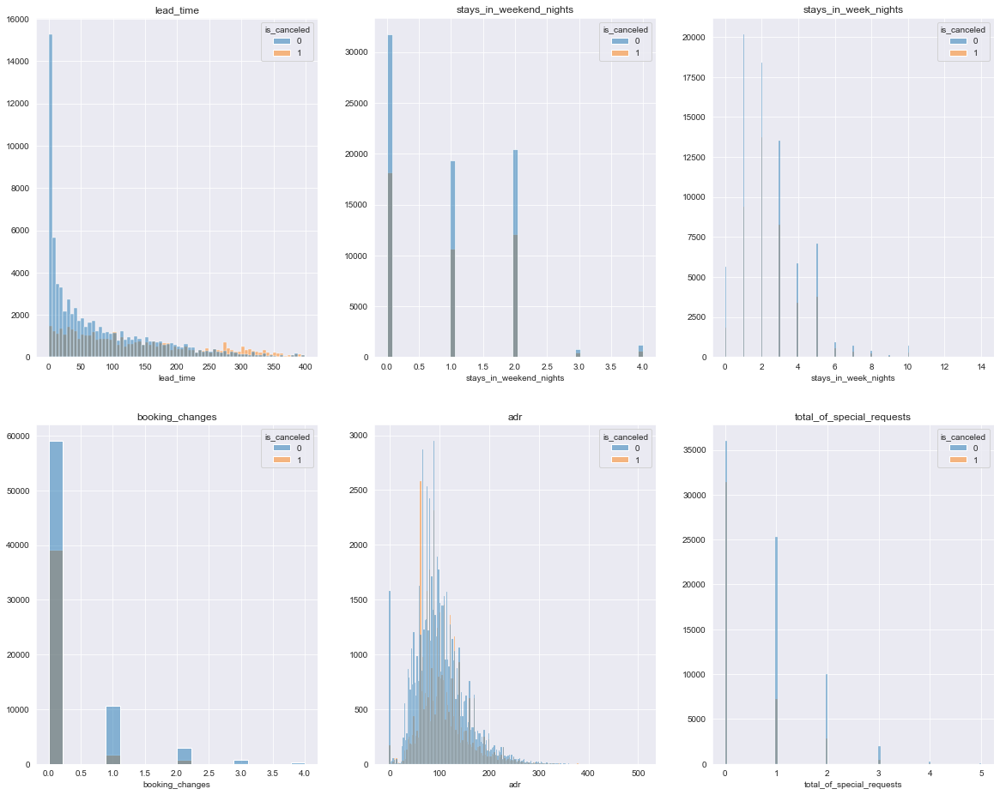

In [22]:
# vars com outliers
sns.set_style(style="darkgrid") 
f, axes = plt.subplots(nrows=2, ncols=3, figsize=(20,16))

sns.histplot(data=df_prep, x='lead_time', hue="is_canceled", ax=axes[0][0]).set(ylabel=None);
sns.histplot(data=df_prep, x='stays_in_weekend_nights', hue="is_canceled", ax=axes[0][1]).set(ylabel=None);
sns.histplot(data=df_prep, x='stays_in_week_nights', hue="is_canceled", ax=axes[0][2]).set(ylabel=None);
sns.histplot(data=df_prep, x='booking_changes', hue="is_canceled", ax=axes[1][0]).set(ylabel=None);
sns.histplot(data=df_prep, x='adr', hue="is_canceled", ax=axes[1][1]).set(ylabel=None);
sns.histplot(data=df_prep, x='total_of_special_requests', hue="is_canceled", ax=axes[1][2]).set(ylabel=None);

axes[0][0].set(title='lead_time');
axes[0][1].set(title='stays_in_weekend_nights');
axes[0][2].set(title='stays_in_week_nights');
axes[1][0].set(title='booking_changes');
axes[1][1].set(title='adr');
axes[1][2].set(title='total_of_special_requests');

plt.show();

In [23]:
df_prep['log_lead_time'] = np.log(df_prep['lead_time'] + 1)
df_prep['log_stays_in_weekend_nights'] = np.log(df_prep['stays_in_weekend_nights'] + 1)
df_prep['log_stays_in_week_nights'] = np.log(df_prep['stays_in_week_nights'] + 1)
df_prep['log_booking_changes'] = np.log(df_prep['booking_changes'] + 1)
df_prep['log_adr'] = np.log(df_prep['adr'] + 1)
df_prep['log_total_of_special_requests'] = np.log(df_prep['total_of_special_requests'] + 1)


/Users/lagonick/opt/anaconda3/lib/python3.7/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


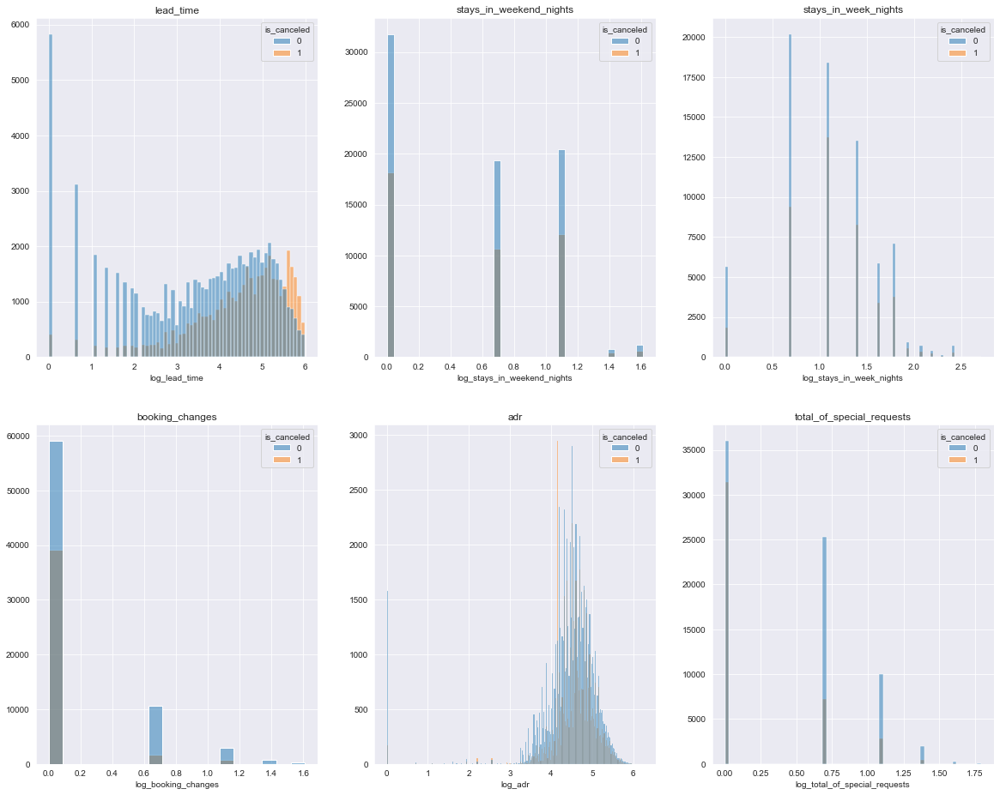

In [24]:
# vars com outliers
sns.set_style(style="darkgrid") 
f, axes = plt.subplots(nrows=2, ncols=3, figsize=(20,16))

sns.histplot(data=df_prep, x='log_lead_time', hue="is_canceled", ax=axes[0][0]).set(ylabel=None);
sns.histplot(data=df_prep, x='log_stays_in_weekend_nights', hue="is_canceled", ax=axes[0][1]).set(ylabel=None);
sns.histplot(data=df_prep, x='log_stays_in_week_nights', hue="is_canceled", ax=axes[0][2]).set(ylabel=None);
sns.histplot(data=df_prep, x='log_booking_changes', hue="is_canceled", ax=axes[1][0]).set(ylabel=None);
sns.histplot(data=df_prep, x='log_adr', hue="is_canceled", ax=axes[1][1]).set(ylabel=None);
sns.histplot(data=df_prep, x='log_total_of_special_requests', hue="is_canceled", ax=axes[1][2]).set(ylabel=None);

axes[0][0].set(title='lead_time');
axes[0][1].set(title='stays_in_weekend_nights');
axes[0][2].set(title='stays_in_week_nights');
axes[1][0].set(title='booking_changes');
axes[1][1].set(title='adr');
axes[1][2].set(title='total_of_special_requests');

plt.show();

In [25]:
correlation = df_prep.corr()['is_canceled'].abs().sort_values(ascending = False)
correlation

is_canceled                       1.000000
log_lead_time                     0.311637
lead_time                         0.283210
log_total_of_special_requests     0.242453
previous_cancellations            0.226659
total_of_special_requests         0.224975
required_car_parking_spaces       0.196192
log_booking_changes               0.166986
booking_changes                   0.151872
is_agent                          0.101174
is_company                        0.097055
log_adr                           0.092856
is_repeated_guest                 0.082881
agent                             0.077739
days_in_waiting_list              0.077096
adr                               0.063525
adults                            0.060304
previous_bookings_not_canceled    0.058486
log_stays_in_week_nights          0.051304
babies                            0.032859
stays_in_week_nights              0.025945
company                           0.022353
arrival_date_year                 0.018193
children   

## III.x Droping Unecessary Columns

In [26]:
df_prep.shape[0]/df.shape[0]

0.9682469218527515

In [ ]:
cols_to_drop = ["agent", "company", "total_of_special_requests", "adr", "booking_changes", "stays_in_week_nights", "stays_in_weekend_nights", "lead_time"]